# Bunch longitudinal distribution --> comparison with proton data with averaging

Having a look to the streak camera data recorded on the 2nd of November to understand if the proton beam is gaussian-, cos^2- or what- distributed

Ok so now the problem is: the laser to align the streak camera frames was not working. This is a problem due to the jittering trigger of the camera. 

Let's attempt to align the profiles fitting the data ...


In [125]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [126]:
import pandas as pnd
import glob
import os
import h5py

In [127]:
print_pdf = False

# Import the data 

Generated in the file 3.Analytical-distribution....

In [128]:
data = pnd.read_pickle('data_streak_camera_AM.pkl')
data.head()

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/anaconda3/lib/python3.7/site-packages/pandas/io/pickle.py", line 166, in try_read
    return read_wrapper(lambda f: pkl.load(f))
  File "/anaconda3/lib/python3.7/site-packages/pandas/io/pickle.py", line 147, in read_wrapper
    is_text=False)
  File "/anaconda3/lib/python3.7/site-packages/pandas/io/common.py", line 406, in _get_handle
    f = open(path_or_buf, mode)
FileNotFoundError: [Errno 2] No such file or directory: 'data_streak_camera_AM.pkl'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/anaconda3/lib/python3.7/site-packages/pandas/io/pickle.py", line 171, in try_read
    lambda f: pc.load(f, encoding=encoding, compat=False))
  File "/anaconda3/lib/python3.7/site-packages/pandas/io/pickle.py", line 147, in read_wrapper
    is_text=False)
  File "/anaconda3/lib/python3.7/site-packages/pandas/io/common.py", line 406, in _get_handle
    f = open(path_or_buf, mode)
FileNotF

TypeError: can only concatenate str (not "list") to str

# Let's try to fit the longitudinal profile:

**Need to modify a bit the fitting functions:**

### Gaussian:

That's ok, but need to add a skew baseline

$$
f(x) = \frac{N e}{\sigma \sqrt{2 \pi}} e^{-\frac{(x-\mu)^2}{\sigma^2} } + a + bx
$$


### Cosine square

Same story, and the arbitrary phase 

$$
f(x) = \frac{1}{2\sigma} cos^2(\frac{\pi}{4\sigma} x - \mu) + a + bx
$$

In [37]:
def gaussian_shape(x, mu, sig):
    return 1./((sig*np.sqrt(np.pi*2))) * np.exp(-0.5*((x-mu)/sig)**2)

def current(x, N, mu, sig):
    from scipy.constants import e
    return e*N*gaussian_shape(x, mu, sig)

def gaussian_shape_baseline(x, A, mu, sig, a, b):
    return a + b*x + (A/((sig*np.sqrt(np.pi*2))) * np.exp(-0.5*((x-mu)/sig)**2) )


In [38]:
def cos2_shape(x, sigma):
    a = np.pi/(4*sigma)
    
    full_out = (1./2. / sigma)*np.cos(a*x)**2
    full_out[x<-2*sigma] = 0.
    full_out[x>2*sigma] = 0.
    
    return full_out

def cos2_current(x, N, sig):
    from scipy.constants import e
    return e*N*cos2_shape(x, sig)

def cos2_shape_complete(x, A=1., mu=0., sigma=1.):
    '''
    A much more complete cos^2 routine, including the mu shift and aplitude normalisation !
    '''
    a = np.pi/(4*sigma)
    
    mu2 = mu/(4*sigma/np.pi)
    
    full_out = A*((1./2. / sigma)*np.cos(a*x - mu2)**2 )
    full_out[x < (mu - 2*sigma)] = 0.
    full_out[x > (mu + 2*sigma)] = 0.
    
    return full_out

def cos2_shape_baseline(x, A=1., mu=0., sigma=1., off=0., b=0.):
    a = np.pi/(4*sigma)
    
    mu2 = mu/(4*sigma/np.pi) # corrects the mu in order to have a movement of x=1 putting 1 in input
    
    full_out = A*((1./2. / sigma)*np.cos(a*x - mu2)**2 )
    baseline = (b*x) + off
    
    full_out += baseline
    
    full_out[x < (mu - 2*sigma)] = baseline[x < (mu - 2*sigma)]
    full_out[x > (mu + 2*sigma)] = baseline[x > (mu + 2*sigma)]
    
    return full_out

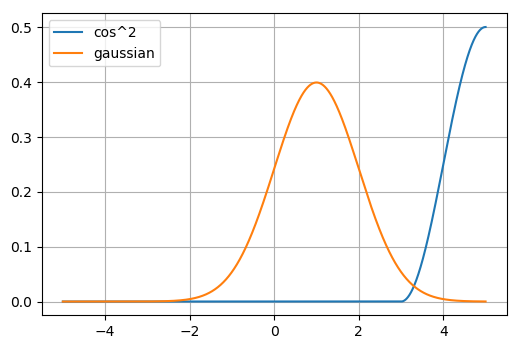

In [39]:
# distribution checks
sigma_p = 1.

tscale = np.linspace(-5*sigma_p, 5*sigma_p, 2**20)

plt.plot(tscale, cos2_shape_baseline(tscale, A=1., mu=5, sigma=sigma_p, off=0., b=0.),label='cos^2')
plt.plot(tscale, gaussian_shape_baseline(tscale, 1., 1., sigma_p, 0., 0.),label='gaussian')
plt.legend(frameon=True)


plt.gcf().dpi=100
plt.grid()
# plt.xlim(1.5, 9)

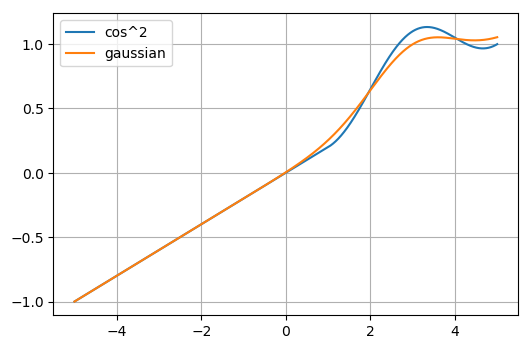

In [40]:
# distribution checks
sigma_p = 1.

tscale = np.linspace(-5*sigma_p, 5*sigma_p, 2**20)

plt.plot(tscale, cos2_shape_baseline(tscale, A=1., mu=3., sigma=sigma_p, off=0., b=.2),label='cos^2')
plt.plot(tscale, gaussian_shape_baseline(tscale, 1., 3., sigma_p, 0., 0.2),label='gaussian')
plt.legend(frameon=True)


plt.gcf().dpi=100
plt.grid()
# plt.xlim(1.5, 9)

# Data selection:

- Intensity > 15
- Pixel sum in the ROI > 200e6

In [41]:
flags = data['BCT_bunchIntensity'] < 15
data = data.drop(data.loc[flags].index)

In [42]:
flags = data['ScImage_ROI'].apply(lambda x: np.sum(x)) < 200e6
data = data.drop(data.loc[flags].index)

### CHECK ROUTINE --> PRINTS ALL THE IMAGES
# pixel_sum = []
# for k in range(len(data)):
#     #### IMAGE PLOT
#     im = data['ScImage_ROI'].iloc[k]
    
#     pix_sum = np.sum(data['ScImage_ROI'].iloc[k])
#     pixel_sum.append(pix_sum)
    
#     fig, ax = plt.subplots(1, dpi=200)
#     # image plot
#     ax.imshow(im, clim=(0, 30e3))
#     ax.set_title(pix_sum*1e-6)


In [43]:
from scipy.optimize import curve_fit

In [44]:
thr = 0.5

# Fit all the profiles !
data['Gauss_popt'] = [np.empty(0,dtype=float)]*len(data)
data['Gauss_pcov'] = [np.empty(0,dtype=float)]*len(data)
data['Sigma_gauss'] = np.nan
data['Gauss_chi2'] = np.nan
data['Cos2_popt'] = [np.empty(0,dtype=float)]*len(data)
data['Cos2_pcov'] = [np.empty(0,dtype=float)]*len(data)
data['Sigma_cos2'] = np.nan
data['Cos2_chi2'] = np.nan
data['Parab_top_half'] = np.nan

for ts in data.index:
    
    xx = data['SCtimeAxis_ROI'].loc[ts]
    yy = data['Streak_profile'].loc[ts]/np.max(data['Streak_profile'].loc[ts])

    # gaussian
    popt, pcov = curve_fit(gaussian_shape_baseline, xx, yy, p0=[1., np.mean(xx), 200., 0., 0.], 
                           bounds=([0., 0., 0., 0., 0.],[np.inf, xx[-1], np.inf, 0.1*yy.max(), 1.]) )
    chi2 = np.sum((yy - gaussian_shape_baseline(xx,*popt))**2 / gaussian_shape_baseline(xx,*popt))
    data['Gauss_popt'].loc[ts] = popt
    data['Gauss_pcov'].loc[ts] = pcov
    data['Gauss_chi2'].loc[ts] = chi2
    data['Sigma_gauss'].loc[ts] = popt[2]


    # cos^2
    popt, pcov = curve_fit(cos2_shape_baseline, xx, yy, p0=[1., np.mean(xx), 200., 0., 0.], 
                           bounds=([0., 0., 0., 0., 0.],[np.inf, xx[-1], 600., 0.2, 1.]) )
    chi2 = np.sum((yy - cos2_shape_baseline(xx,*popt))**2 / gaussian_shape_baseline(xx,*popt))
    data['Cos2_popt'].loc[ts] = popt
    data['Cos2_pcov'].loc[ts] = pcov
    data['Cos2_chi2'].loc[ts] = chi2
    data['Sigma_cos2'].loc[ts] = popt[2]
    
    # parabula of the 50% top of the profile
    coef = np.polyfit(xx[yy>thr], yy[yy>thr], 2)
    p = np.poly1d(coef)
    data['Parab_top_half'].loc[ts] = -coef[1]/(2*coef[0])

##### DEBUG ROUTINE
# k = 1

# # rough manual fit of the curves
# xx = data['SCtimeAxis_ROI'].iloc[k]
# yy = data['Streak_profile'].iloc[k]*1e-6

# fig, ax = plt.subplots(1, dpi=150)
# plt.plot(xx, yy,'.')

# # gaussian
# popt, pcov = curve_fit(gaussian_shape_baseline, xx, yy, p0=[1., np.mean(xx), 200., 0., 0.], 
#                        bounds=([0., 0., 0., 0., 0.],[np.inf, xx[-1], np.inf, 0.1*yy.max(), 1.]) )
# ax.plot(xx, gaussian_shape_baseline(xx,*popt), label='Gaussian fit')
# print('Sigma from gauss fit = %.2f ps'%popt[2])
# chi2 = np.sum((yy - gaussian_shape_baseline(xx,*popt))**2 / gaussian_shape_baseline(xx,*popt))
# print(chi2)

# # cos^2
# popt, pcov = curve_fit(cos2_shape_baseline, xx, yy, p0=[1., np.mean(xx), 200., 0., 0.], 
#                        bounds=([0., 0., 0., 0., 0.],[np.inf, xx[-1], 600., 0.2, 1.]) )
# ax.plot(xx, cos2_shape_baseline(xx,*popt), label='Cos^2 fit')
# print('Sigma from cos^2 fit = %.2f ps'%popt[2])
# chi2 = np.sum((yy - cos2_shape_baseline(xx,*popt))**2 / gaussian_shape_baseline(xx,*popt))
# print(chi2)


# ax.legend(frameon=True)

/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:189: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


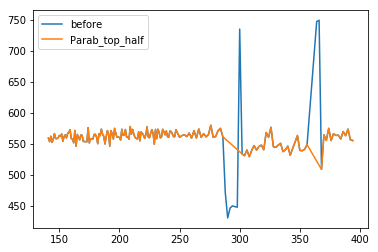

In [45]:
# CLEANUP: kill the shots where the trigger drift too much
plt.plot(data['Parab_top_half'],label='before')
flags = (data['Parab_top_half'] > 500) & (data['Parab_top_half'] < 600)
data = data.drop(data.loc[~flags].index)

plt.plot(data['Parab_top_half'])
plt.legend()

In [46]:
# ##### DEBUG ROUTINE    
# thr = 0.5
    
# k = 100

# for k in range(len(data)):
#     # rough manual fit of the curves
#     xx = data['SCtimeAxis_ROI'].iloc[k]
#     yy = data['Streak_profile'].iloc[k] / np.max(data['Streak_profile'].iloc[k])

#     fig, ax = plt.subplots(1, dpi=150)
#     plt.plot(xx, yy,'.')

#     # gaussian
#     popt, pcov = curve_fit(gaussian_shape_baseline, xx, yy, p0=[1., np.mean(xx), 200., 0., 0.], 
#                            bounds=([0., 0., 0., 0., 0.],[np.inf, xx[-1], np.inf, 0.1*yy.max(), 1.]) )
#     ax.plot(xx, gaussian_shape_baseline(xx,*popt), label='Gaus mu = '+str(popt[1]))

#     # cos^2
#     popt, pcov = curve_fit(cos2_shape_baseline, xx, yy, p0=[1., np.mean(xx), 200., 0., 0.], 
#                            bounds=([0., 0., 0., 0., 0.],[np.inf, xx[-1], 600., 0.2, 1.]) )
#     ax.plot(xx, cos2_shape_baseline(xx,*popt), label='Cos^2 mu = '+str(popt[1]))

#     # poly5
#     coef = np.polyfit(xx[yy>thr], yy[yy>thr], 2)
#     p = np.poly1d(coef)
#     ax.plot(xx[yy>thr], p(xx[yy>thr]),'k', label='Poly5 mu = '+str(-coef[1]/(2*coef[0])))


#     ax.set_ylim(0)
#     ax.legend(frameon=True)

# Ok now let's try the averaging

# Changed mind, no averaging, let's do zero padding instead with baseline subtraction

In [47]:
# again, sloppy way


for k in range(len(data)):
    # baseline from the tails
    xx = data['SCtimeAxis_ROI'].iloc[k]
    yy = data['Streak_profile'].iloc[k] / np.max(data['Streak_profile'].iloc[k])
    
    # subset to select tails only
    x1 = xx[:20]
    x2 = xx[-10:]
    xnew = np.concatenate((x1, x2))
    y1 = yy[:20]
    y2 = yy[-10:]
    ynew = np.concatenate((y1, y2))
    
    # fit baseline 
    param = np.polyfit(xnew, ynew, 1)
    
    # baseline removed
    yy_no_bline = yy - (xx*param[0] + param[1])

    


No handles with labels found to put in legend.


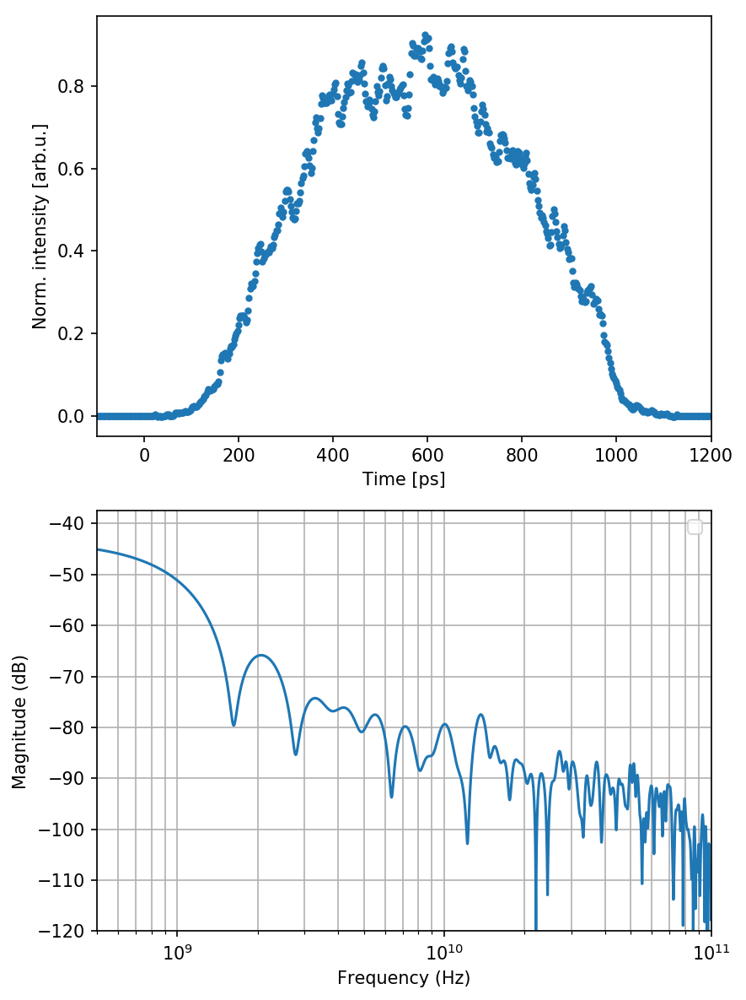

In [48]:
def doFFT(t, y):
    '''
    Do the FFT. Beware there is a factor 2 in the normalisation, so look at the right-hand side of the spectrum only.
    '''
    assert t.size == y.size, 'Different size in X and Y in the doFFT function'
    dt = np.abs(t[1]-t[0])
    N_sample = t.size
    
    norm = 2/N_sample
    
    s_fft = norm*np.abs(np.fft.fft(y))
    f_fft = np.fft.fftfreq(N_sample, d=dt)
    df = np.abs(f_fft[1]-f_fft[0])
    
    # reorder the fft
    f_fft = np.fft.fftshift(f_fft)
    s_fft = np.fft.fftshift(s_fft)

    return f_fft, s_fft

def dB(x):
    return 20*np.log10(x)


##### DEBUG ROUTINE    
final_length = 2**16

k = 78

# for k in range(1):
# baseline from the tails
xx = data['SCtimeAxis_ROI'].iloc[k]
yy = data['Streak_profile'].iloc[k] / np.max(data['Streak_profile'].iloc[k])

# subset to select tails only
x1 = xx[:20]
x2 = xx[-10:]
xnew = np.concatenate((x1, x2))
y1 = yy[:20]
y2 = yy[-10:]
ynew = np.concatenate((y1, y2))

# fit baseline 
param = np.polyfit(xnew, ynew, 1)

# baseline removed
yy_no_bline = yy - (xx*param[0] + param[1])

# zero padding
assert (final_length > len(xx)) & (np.mod(final_length-len(xx),2) == 0)
pad_len = final_length - len(xx)
yy_zero_pad = np.concatenate((np.zeros(int(pad_len/2)), yy_no_bline, np.zeros(int(pad_len/2))))
dt = xx[1]-xx[0]
xx = np.concatenate((np.linspace(xx[0]-(pad_len/2)*dt, xx[0]-dt, int(pad_len/2)), xx, np.linspace(xx[-1]+dt, xx[-1]+(pad_len/2)*dt, int(pad_len/2))))






####### PRINTING
fig, ax = plt.subplots(2, dpi=150, figsize=(6,8))
ax[0].plot(xx, yy_zero_pad,'.')
ax[0].set_xlim(-100,1200)
ax[0].set_xlabel('Time [ps]')
ax[0].set_ylabel('Norm. intensity [arb.u.]')

####### FFT
xx = xx*1e-12 # time domain conversion

x_fft, y_fft = doFFT(xx,yy_zero_pad)
ax[1].plot(x_fft, dB(y_fft),'-')
ax[1].set_xlim(5e8, 10e10)
ax[1].set_ylim(-120,)

ax[1].set_xscale('log')
ax[1].grid(which='both')
ax[1].set_ylabel('Magnitude (dB)')
ax[1].set_xlabel('Frequency (Hz)')
ax[1].legend(frameon=True)


fig.tight_layout()

/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


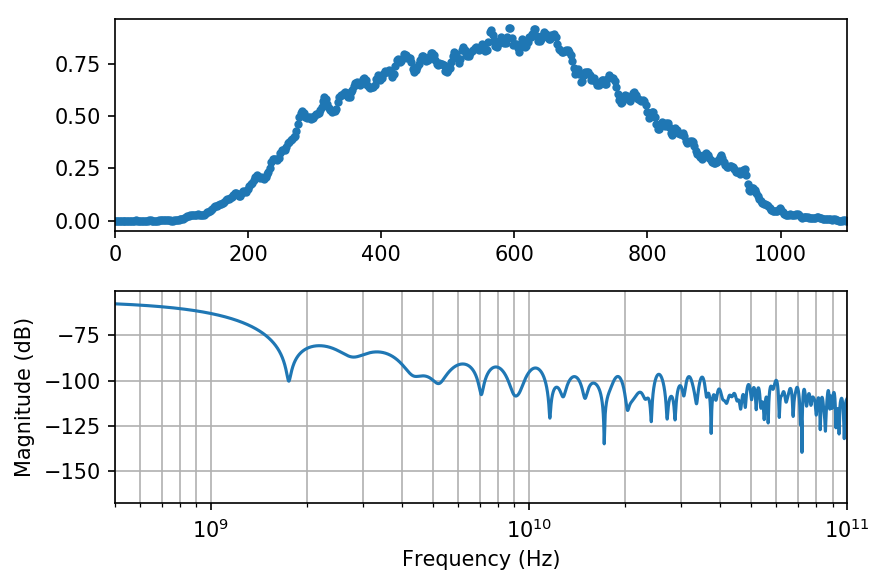

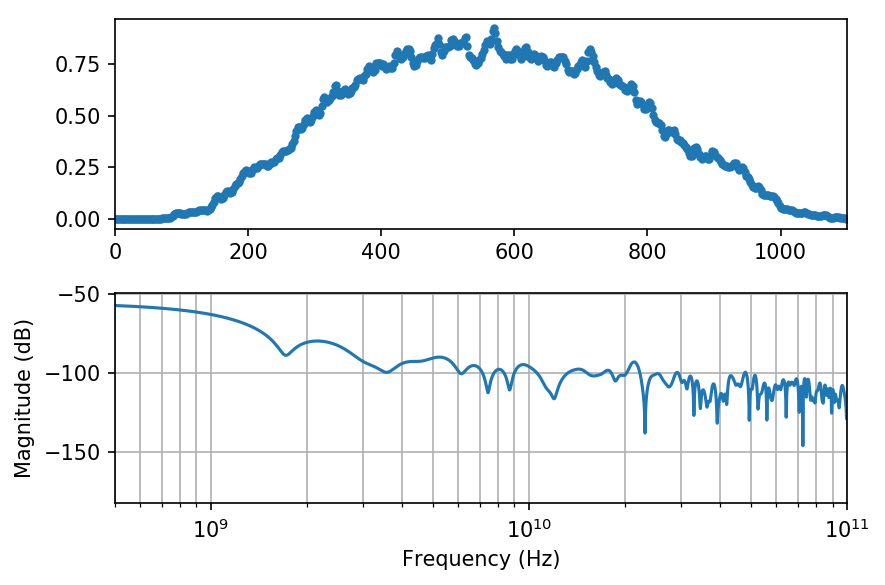

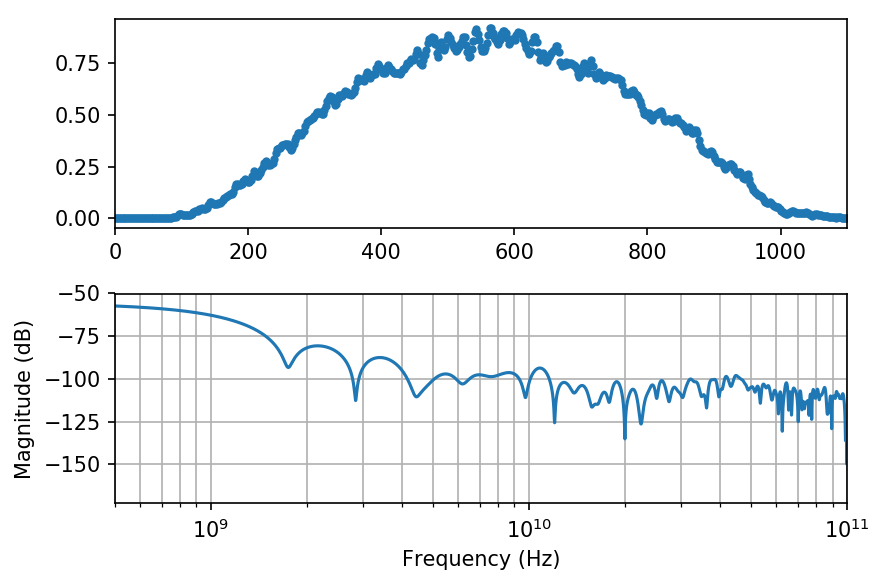

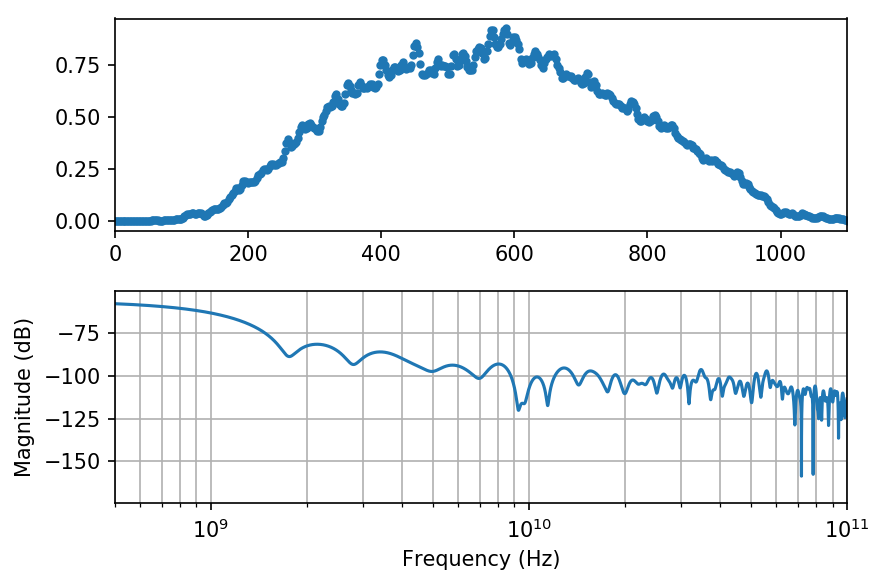

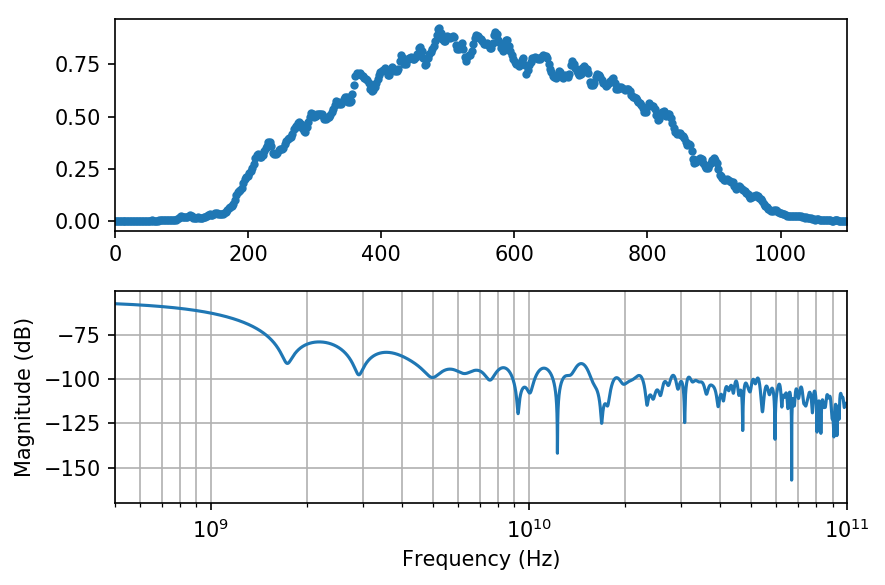

...

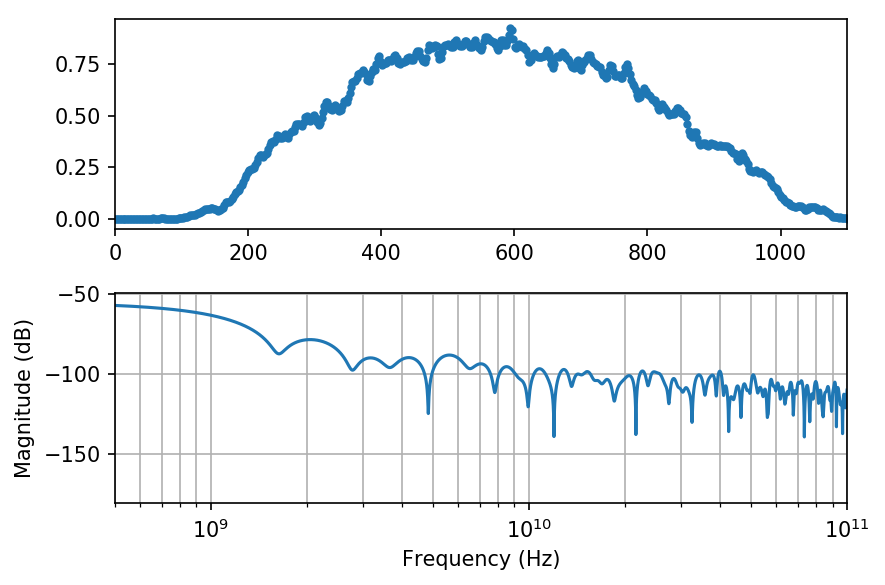

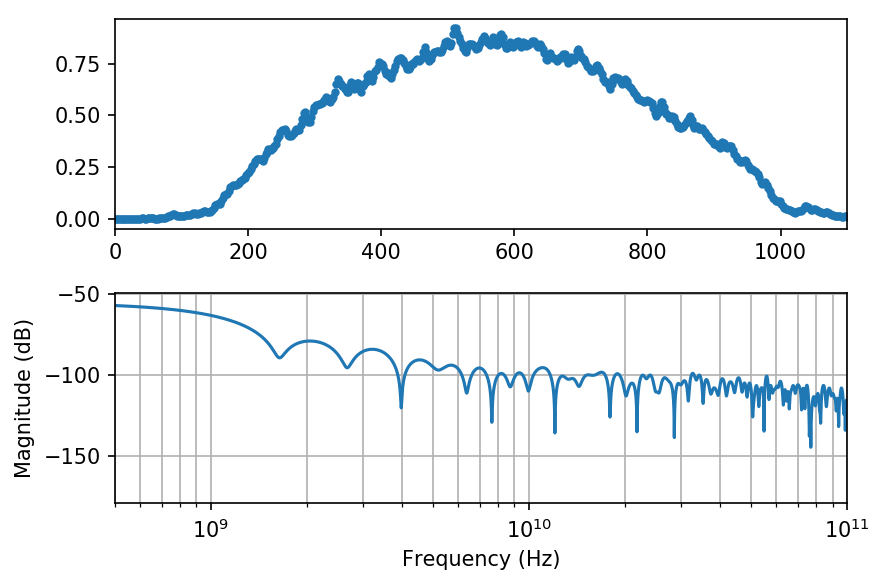

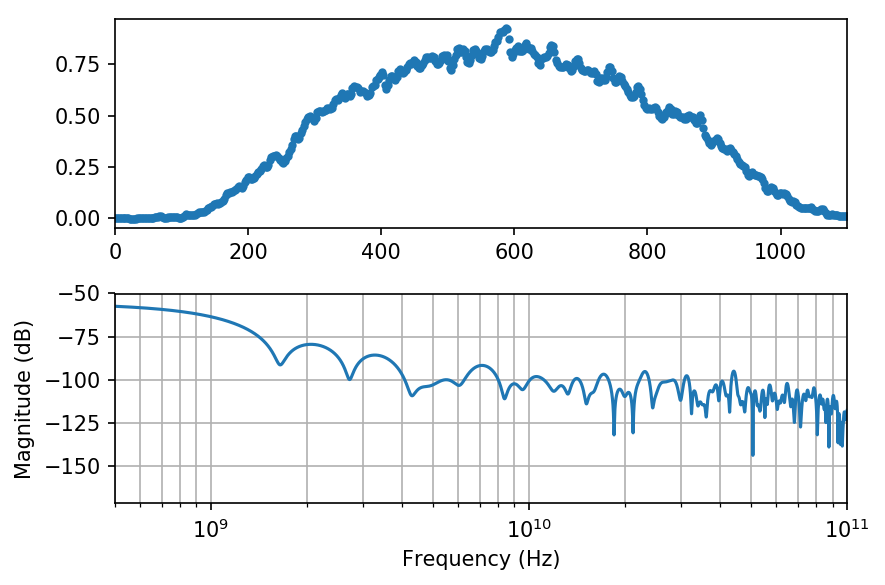

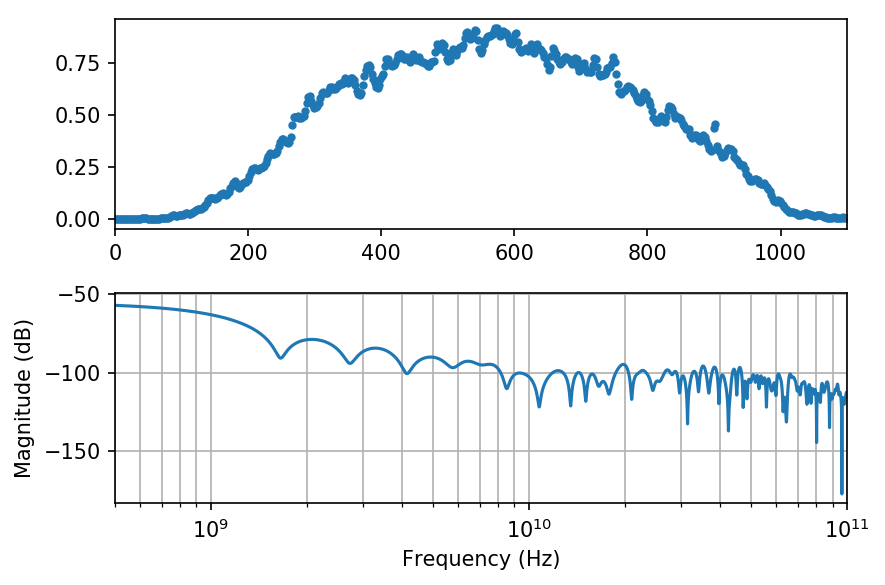

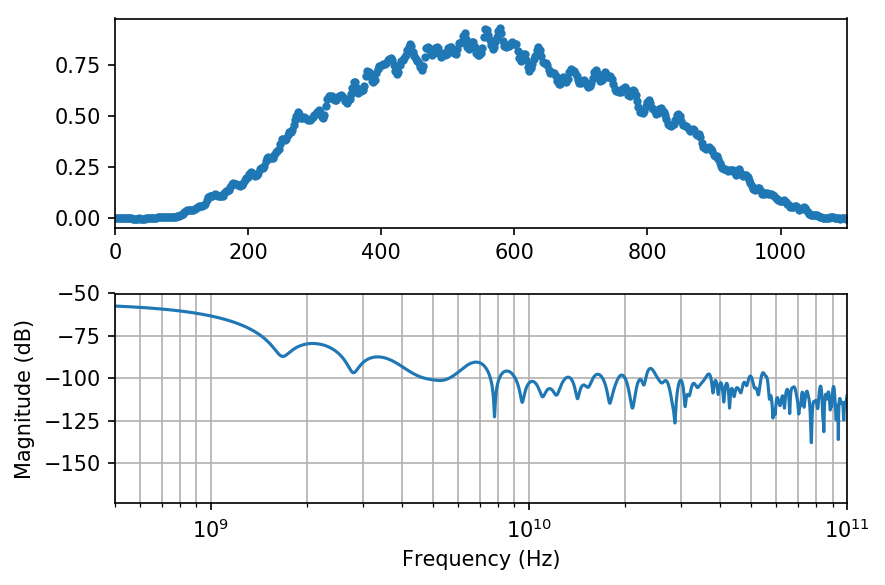

In [49]:
def doFFT(t, y):
    '''
    Do the FFT. Beware there is a factor 2 in the normalisation, so look at the right-hand side of the spectrum only.
    '''
    assert t.size == y.size, 'Different size in X and Y in the doFFT function'
    dt = np.abs(t[1]-t[0])
    N_sample = t.size
    
    norm = 2/N_sample
    
    s_fft = norm*np.abs(np.fft.fft(y))
    f_fft = np.fft.fftfreq(N_sample, d=dt)
    df = np.abs(f_fft[1]-f_fft[0])
    
    # reorder the fft
    f_fft = np.fft.fftshift(f_fft)
    s_fft = np.fft.fftshift(s_fft)

    return f_fft, s_fft

def dB(x):
    return 20*np.log10(x)


##### DEBUG ROUTINE    
final_length = 2**18

k = 1

for k in range(len(data)):
    # baseline from the tails
    xx = data['SCtimeAxis_ROI'].iloc[k]
    yy = data['Streak_profile'].iloc[k] / np.max(data['Streak_profile'].iloc[k])

    # subset to select tails only
    x1 = xx[:20]
    x2 = xx[-10:]
    xnew = np.concatenate((x1, x2))
    y1 = yy[:20]
    y2 = yy[-10:]
    ynew = np.concatenate((y1, y2))

    # fit baseline 
    param = np.polyfit(xnew, ynew, 1)

    # baseline removed
    yy_no_bline = yy - (xx*param[0] + param[1])

    # zero padding
    assert (final_length > len(xx)) & (np.mod(final_length-len(xx),2) == 0)
    pad_len = final_length - len(xx)
    yy_zero_pad = np.concatenate((np.zeros(int(pad_len/2)), yy_no_bline, np.zeros(int(pad_len/2))))
    dt = xx[1]-xx[0]
    xx = np.concatenate((np.linspace(xx[0]-(pad_len/2)*dt, xx[0]-dt, int(pad_len/2)), xx, np.linspace(xx[-1]+dt, xx[-1]+(pad_len/2)*dt, int(pad_len/2))))






    ####### PRINTING
    fig, ax = plt.subplots(2, dpi=150)
    ax[0].plot(xx, yy_zero_pad,'.')
    ax[0].set_xlim(0, 1100)


    ####### FFT

    xx = xx*1e-12 # time domain conversion

    x_fft, y_fft = doFFT(xx,yy_zero_pad)
    ax[1].plot(x_fft, dB(y_fft),'-')
    ax[1].set_xlim(5e8, 10e10)
    # ax[1].set_ylim(50,)
    ax[1].set_xscale('log')
    ax[1].grid(which='both')
    ax[1].set_ylabel('Magnitude (dB)')
    ax[1].set_xlabel('Frequency (Hz)')

    fig.tight_layout()

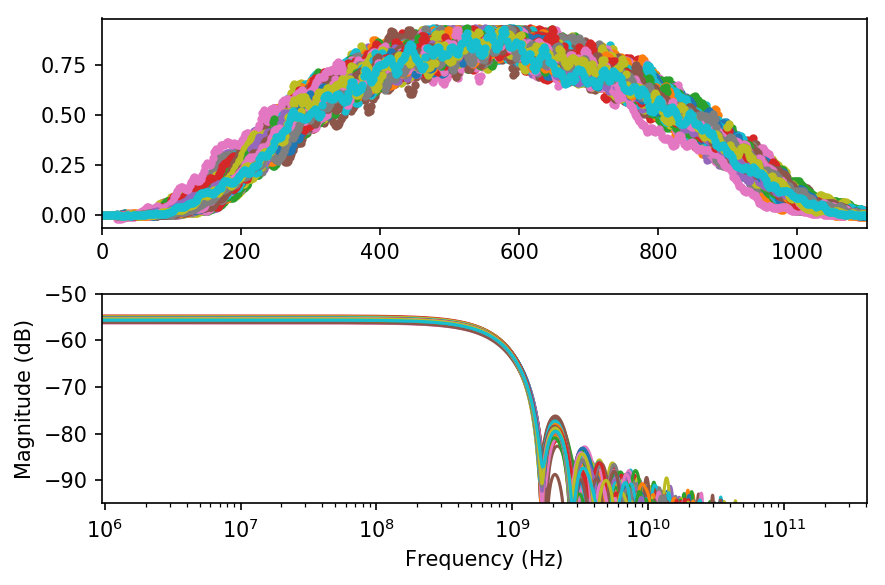

In [50]:
def doFFT(t, y):
    '''
    Do the FFT. Beware there is a factor 2 in the normalisation, so look at the right-hand side of the spectrum only.
    '''
    assert t.size == y.size, 'Different size in X and Y in the doFFT function'
    dt = np.abs(t[1]-t[0])
    N_sample = t.size
    
    norm = 2/N_sample
    
    s_fft = norm*np.abs(np.fft.fft(y))
    f_fft = np.fft.fftfreq(N_sample, d=dt)
    df = np.abs(f_fft[1]-f_fft[0])
    
    # reorder the fft
    f_fft = np.fft.fftshift(f_fft)
    s_fft = np.fft.fftshift(s_fft)

    return f_fft, s_fft

def dB(x):
    return 20*np.log10(x)


##### DEBUG ROUTINE    
final_length = 2**18

k = 1
fig, ax = plt.subplots(2, dpi=150)

for k in range(len(data)):
    # baseline from the tails
    xx = data['SCtimeAxis_ROI'].iloc[k]
    yy = data['Streak_profile'].iloc[k] / np.max(data['Streak_profile'].iloc[k])

    # subset to select tails only
    x1 = xx[:20]
    x2 = xx[-10:]
    xnew = np.concatenate((x1, x2))
    y1 = yy[:20]
    y2 = yy[-10:]
    ynew = np.concatenate((y1, y2))

    # fit baseline 
    param = np.polyfit(xnew, ynew, 1)

    # baseline removed
    yy_no_bline = yy - (xx*param[0] + param[1])

    # zero padding
    assert (final_length > len(xx)) & (np.mod(final_length-len(xx),2) == 0)
    pad_len = final_length - len(xx)
    yy_zero_pad = np.concatenate((np.zeros(int(pad_len/2)), yy_no_bline, np.zeros(int(pad_len/2))))
    dt = xx[1]-xx[0]
    xx = np.concatenate((np.linspace(xx[0]-(pad_len/2)*dt, xx[0]-dt, int(pad_len/2)), xx, np.linspace(xx[-1]+dt, xx[-1]+(pad_len/2)*dt, int(pad_len/2))))






    ####### PRINTING
    ax[0].plot(xx, yy_zero_pad,'.')
    ax[0].set_xlim(0, 1100)


    ####### FFT

    xx = xx*1e-12 # time domain conversion

    x_fft, y_fft = doFFT(xx,yy_zero_pad)
    ax[1].plot(x_fft, dB(y_fft),'-')
#     ax[1].set_xlim(5e9, 20e9)
    ax[1].set_ylim(-95,-50)
    ax[1].set_xscale('log')
    ax[1].grid(which='both')
    ax[1].set_ylabel('Magnitude (dB)')
    ax[1].set_xlabel('Frequency (Hz)')

    fig.tight_layout()
    

In [51]:
# sloppy way
data['FFT_freq'] = [np.empty(0)]*len(data)
data['FFT_mag'] = [np.empty(0)]*len(data)

final_length = 2**18

for k in range(len(data)):
    # baseline from the tails
    xx = data['SCtimeAxis_ROI'].iloc[k]
    yy = data['Streak_profile'].iloc[k] / np.max(data['Streak_profile'].iloc[k])

    # subset to select tails only
    x1 = xx[:20]
    x2 = xx[-10:]
    xnew = np.concatenate((x1, x2))
    y1 = yy[:20]
    y2 = yy[-10:]
    ynew = np.concatenate((y1, y2))

    # fit baseline 
    param = np.polyfit(xnew, ynew, 1)

    # baseline removed
    yy_no_bline = yy - (xx*param[0] + param[1])

    # zero padding
    assert (final_length > len(xx)) & (np.mod(final_length-len(xx),2) == 0)
    pad_len = final_length - len(xx)
    yy_zero_pad = np.concatenate((np.zeros(int(pad_len/2)), yy_no_bline, np.zeros(int(pad_len/2))))
    dt = xx[1]-xx[0]
    xx = np.concatenate((np.linspace(xx[0]-(pad_len/2)*dt, xx[0]-dt, int(pad_len/2)), xx, np.linspace(xx[-1]+dt, xx[-1]+(pad_len/2)*dt, int(pad_len/2))))


    ####### FFT

    xx = xx*1e-12 # time domain conversion

    x_fft, y_fft = doFFT(xx,yy_zero_pad)    
    
    data['FFT_freq'].iloc[k] = x_fft
    data['FFT_mag'].iloc[k] = y_fft
   

# Good ! 

## Now let's move on: the idea is to find a time domain fitting function starting from the frequency domain. 

In the frequency domain there are two regimes: 

1) the low frequency, until the ~3-4 GHz, where the envelope function is dominating

2) the high frequency, between say 5-20 GHz, where the microstructure of the bunch is actually contributing very much to the power

## Step 1: normalisation

Bring everything back up to zero dB

In [52]:
# the maximum is at zero freq anyway
data['FFT_mag_norm'] = data['FFT_mag'].apply(lambda x: x/np.max(x))


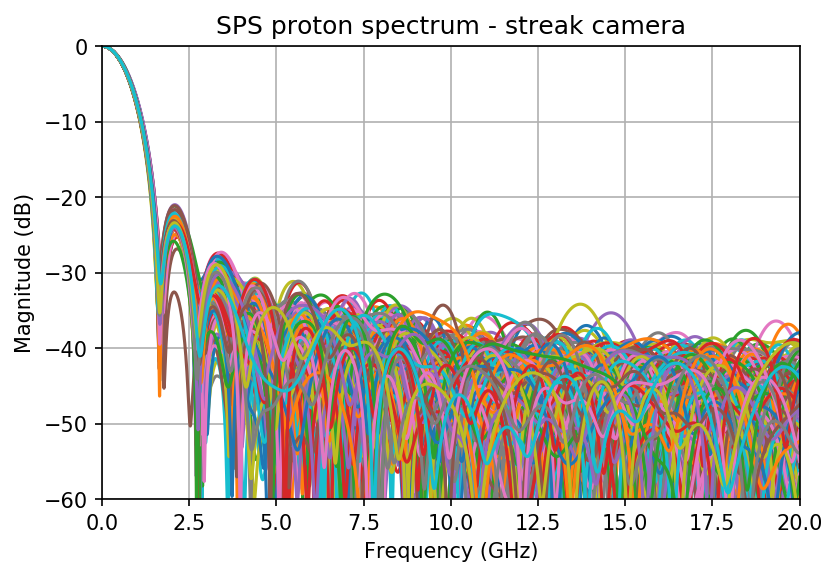

In [53]:
fig, ax = plt.subplots(1, dpi=150)

for k in range(len(data)):
    ax.plot(1e-9*data['FFT_freq'].iloc[k],dB(data['FFT_mag_norm'].iloc[k]))

ax.set_xlim(0,20)
ax.set_ylim(-60,0)
ax.set_xlabel('Frequency (GHz)')
ax.set_ylabel('Magnitude (dB)')
ax.grid(which='both')
ax.set_title('SPS proton spectrum - streak camera')

plt.savefig('Proton-streak-all.png',format='png',dpi=150)

# Step 2: low frequency domain

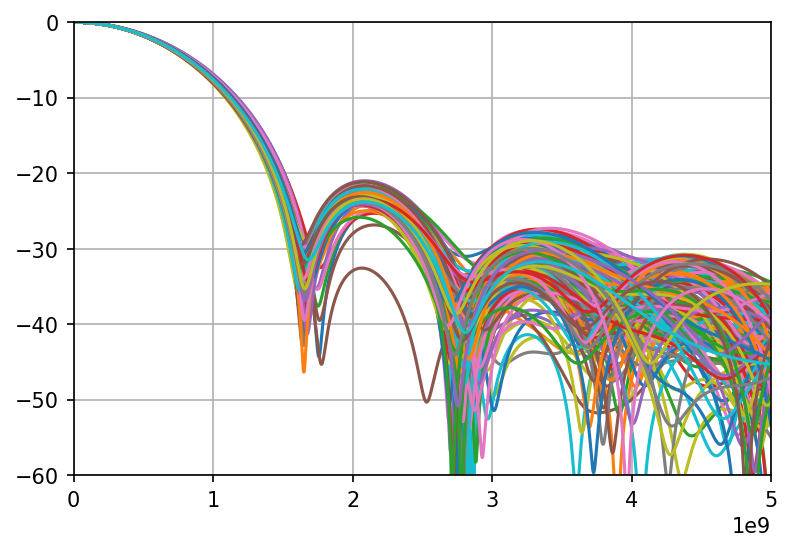

In [54]:
fig, ax = plt.subplots(1, dpi=150)

for k in range(len(data)):
    ax.plot(data['FFT_freq'].iloc[k],dB(data['FFT_mag_norm'].iloc[k]))

ax.set_xlim(0,5e9)
ax.set_ylim(-60,0)
ax.grid(which='both')

In [55]:
# let's check how much the notch is moving first
# minimum between 0 and 2 GHz
notch_f_min = []

for k in range(len(data)):
    idx = np.argmin( dB(data['FFT_mag'].iloc[k])[(data['FFT_freq'].iloc[k] > 0.) & (data['FFT_freq'].iloc[k] < 2e9)] ) 
    notch_f_min.append( data['FFT_freq'].iloc[k][(data['FFT_freq'].iloc[k] > 0.) & (data['FFT_freq'].iloc[k] < 2e9)][idx]  )


Text(0.5, 0, 'Sample no.')

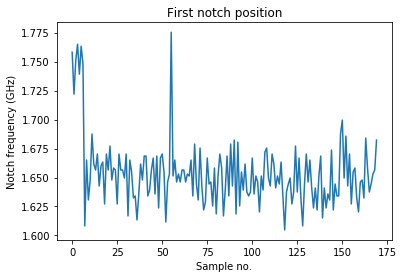

In [56]:
plt.plot(np.array(notch_f_min)*1e-9)
plt.title('First notch position')
plt.ylabel('Notch frequency (GHz)')
plt.xlabel('Sample no.')

# Changed direction again: use the envelope only 

This is because the difference between electrons and protons is already 30 dB, so there is not too much to fit or window ...

Text(0, 0.5, 'Magnitude (dB)')

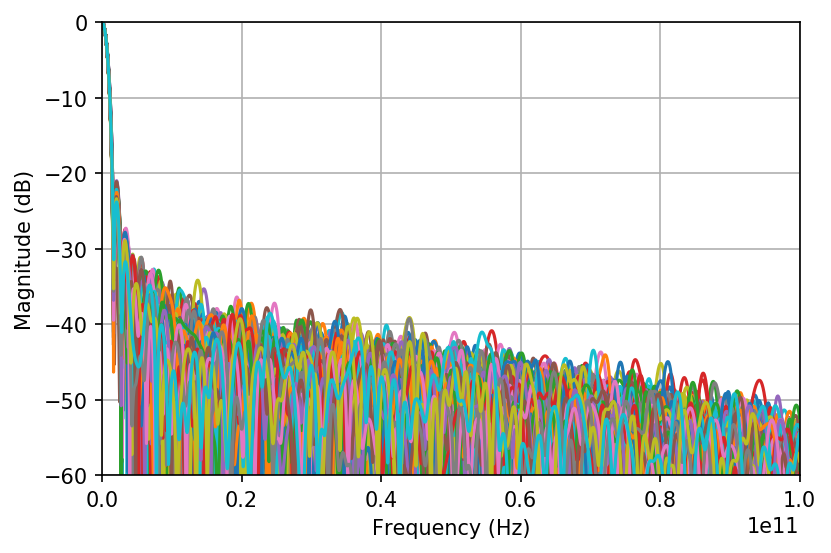

In [57]:
fig, ax = plt.subplots(1, dpi=150)

for k in range(len(data)):
    ax.plot(data['FFT_freq'].iloc[k],dB(data['FFT_mag_norm'].iloc[k]))

ax.set_xlim(0,100e9)
ax.set_ylim(-60,0)
ax.grid(which='both')

ax.set_xlabel('Frequency (Hz)')
ax.set_ylabel('Magnitude (dB)')

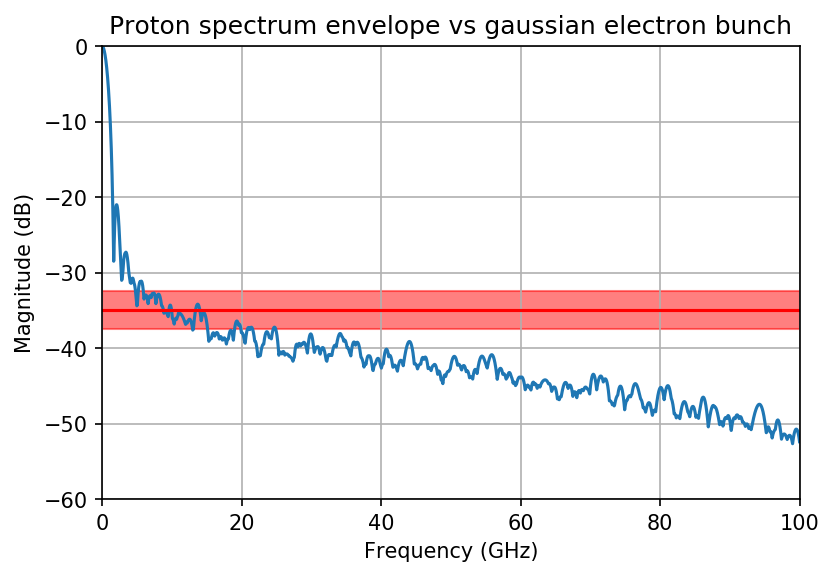

In [58]:
data['FFT_mag_norm_dB'] = data['FFT_mag_norm'].apply(lambda x: dB(x))
# scan frequency by frequency and get the strongest spectrum
     
# build a matrix
dd = data['FFT_mag_norm_dB'].values 
dn = np.empty([dd.shape[0], dd[0].shape[0]])
for k in range(len(dd)):
    dn[k,:] = dd[k]
    
# get the max column-wise
envelope_dB = np.max(dn, axis=0)

# print the envelope
fig, ax = plt.subplots(1, dpi=150)
ax.plot(1e-9*data['FFT_freq'].iloc[0], envelope_dB)

ax.set_xlim(0,100)
ax.set_ylim(-60,0)
ax.grid(which='both')

ax.set_xlabel('Frequency (GHz)')
ax.set_ylabel('Magnitude (dB)')
ax.set_title('Proton spectrum envelope vs gaussian electron bunch')

# print the electron spectrum 
rr = plt.Rectangle((0, -37.5), 100, 5, color='red',alpha=0.5)
ax.add_patch(rr)
ax.axhline(y=-35, color='red')

plt.savefig('Proton-streak-envelope.png',format='png',dpi=150)

Hmm are we reallhy sure they are 30 dB only ??? 
(gaussian assumptions)

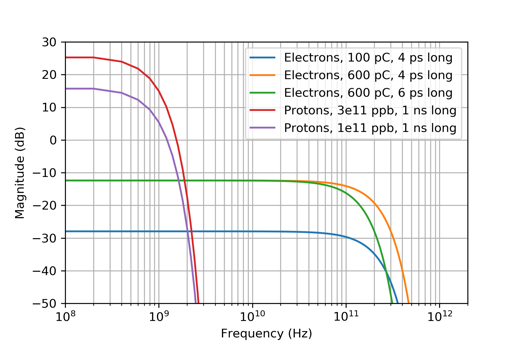

# Same stuff with the envelope, but electron gaussian bunch instead of the line

In [64]:
def coulomb_to_N(charge):
    '''
    Total bunch charge [C] to number of particles per bunch N
    '''
    from scipy.constants import e
    return charge/e

In [88]:
s_p = 1e-9/4.
Np = 3e11
tscale = np.linspace(-10.*s_p, 10.*s_p, 2**20)

# proton bunch, just for adjusting the offset
yy_p = current(tscale, Np, 0., s_p)

# electron bunches
Ne_2 = coulomb_to_N(0.6e-9)
sigma_e_2 = 4e-12/4.
yy_e_2 = current(tscale, Ne_2, 0., sigma_e_2)

Ne_3 = coulomb_to_N(0.6e-9)
sigma_e_3 = 6e-12/4.
yy_e_3 = current(tscale, Ne_3, 0., sigma_e_3)

In [94]:
ff_p, sf_p = doFFT(tscale,yy_p)
ff_e_2, sf_e_2 = doFFT(tscale,yy_e_2)
ff_e_3, sf_e_3 = doFFT(tscale,yy_e_3)

# Normalise the protons to zero 
sf_p_db = dB(sf_p)
sf_e_2_db = dB(sf_e_2)
sf_e_3_db = dB(sf_e_3)

offset = np.max(sf_p_db)
sf_p_db -= offset
sf_e_2_db -= offset
sf_e_3_db -= offset

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in log10


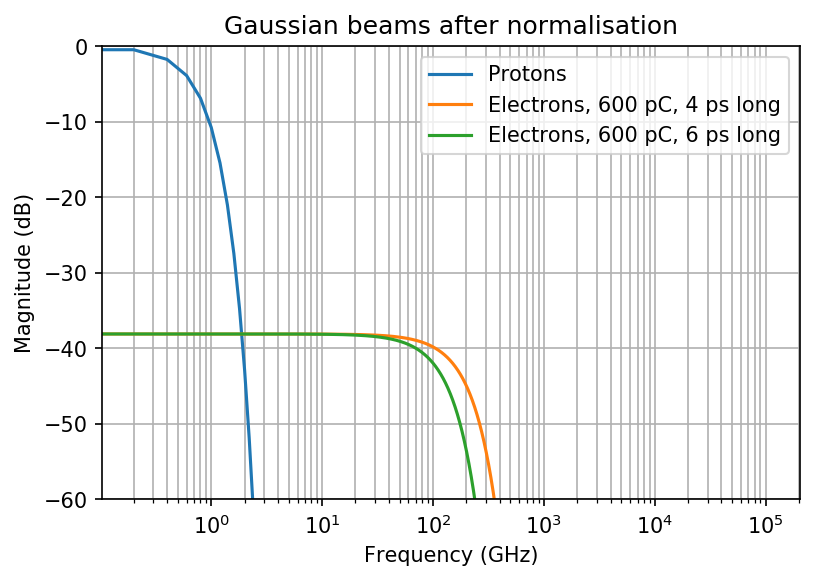

In [97]:
# print the envelope
fig, ax = plt.subplots(1, dpi=150)
# ax.plot(1e-9*data['FFT_freq'].iloc[0], envelope_dB, label='Proton envelope')
ax.plot(1e-9*ff_p, sf_p_db,label='Protons')

# print the electrons
ax.plot(1e-9*ff_e_2, sf_e_2_db,label='Electrons, 600 pC, 4 ps long')
ax.plot(1e-9*ff_e_3, sf_e_3_db,label='Electrons, 600 pC, 6 ps long')


# ax.set_xlim(0,150)
ax.set_xscale('log')
ax.set_ylim(-60,0)
ax.grid(which='both')
ax.set_xlabel('Frequency (GHz)')
ax.set_ylabel('Magnitude (dB)')
ax.set_title('Gaussian beams after normalisation')

ax.legend(frameon=True)

# # print the electron spectrum 
# rr = plt.Rectangle((0, -37.5), 100, 5, color='red',alpha=0.5)
# ax.add_patch(rr)
# ax.axhline(y=-35, color='red')

# plt.savefig('Proton-streak-envelope.png',format='png',dpi=150)

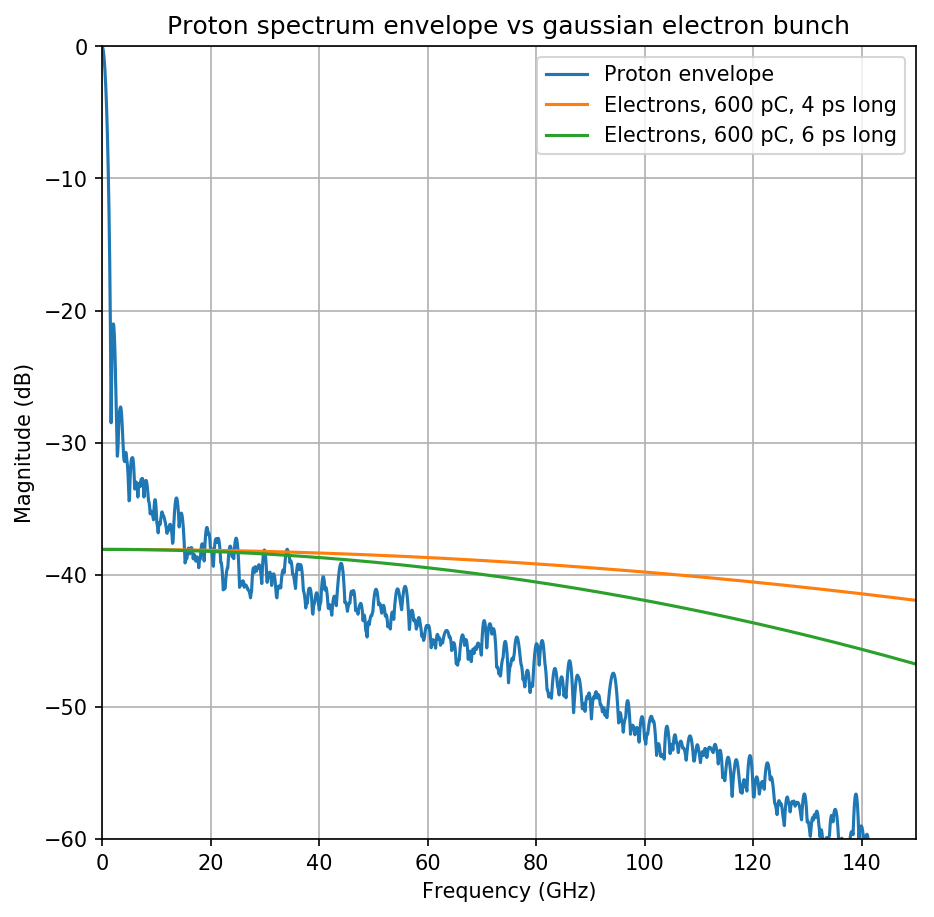

In [103]:
# print the envelope
fig, ax = plt.subplots(1, dpi=150, figsize=(7,7))
ax.plot(1e-9*data['FFT_freq'].iloc[0], envelope_dB, label='Proton envelope')

# print the electrons
ax.plot(1e-9*ff_e_2, sf_e_2_db,label='Electrons, 600 pC, 4 ps long')
ax.plot(1e-9*ff_e_3, sf_e_3_db,label='Electrons, 600 pC, 6 ps long')


ax.set_xlim(0,150)
ax.set_ylim(-60,0)
ax.grid(which='both')

ax.set_xlabel('Frequency (GHz)')
ax.set_ylabel('Magnitude (dB)')
ax.set_title('Proton spectrum envelope vs gaussian electron bunch')

ax.legend(frameon=True)

# # print the electron spectrum 
# rr = plt.Rectangle((0, -37.5), 100, 5, color='red',alpha=0.5)
# ax.add_patch(rr)
# ax.axhline(y=-35, color='red')

plt.savefig('Proton-streak-envelope-vs-gauss-electrons.png',format='png',dpi=150)

In [108]:
# include the run2 parameters
# electron bunches
Ne_4 = coulomb_to_N(0.1e-9)
sigma_e_4 = 100e-15/4.
yy_e_4 = current(tscale, Ne_4, 0., sigma_e_4)

Ne_5 = coulomb_to_N(0.1e-9)
sigma_e_5 = 50e-15/4.
yy_e_5 = current(tscale, Ne_5, 0., sigma_e_5)

ff_e_4, sf_e_4 = doFFT(tscale,yy_e_4)
ff_e_5, sf_e_5 = doFFT(tscale,yy_e_5)

# Normalise the protons to zero 
sf_p_db = dB(sf_p)
sf_e_4_db = dB(sf_e_4)
sf_e_5_db = dB(sf_e_5)

offset = np.max(sf_p_db)
sf_e_4_db -= offset
sf_e_5_db -= offset

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: divide by zero encountered in log10


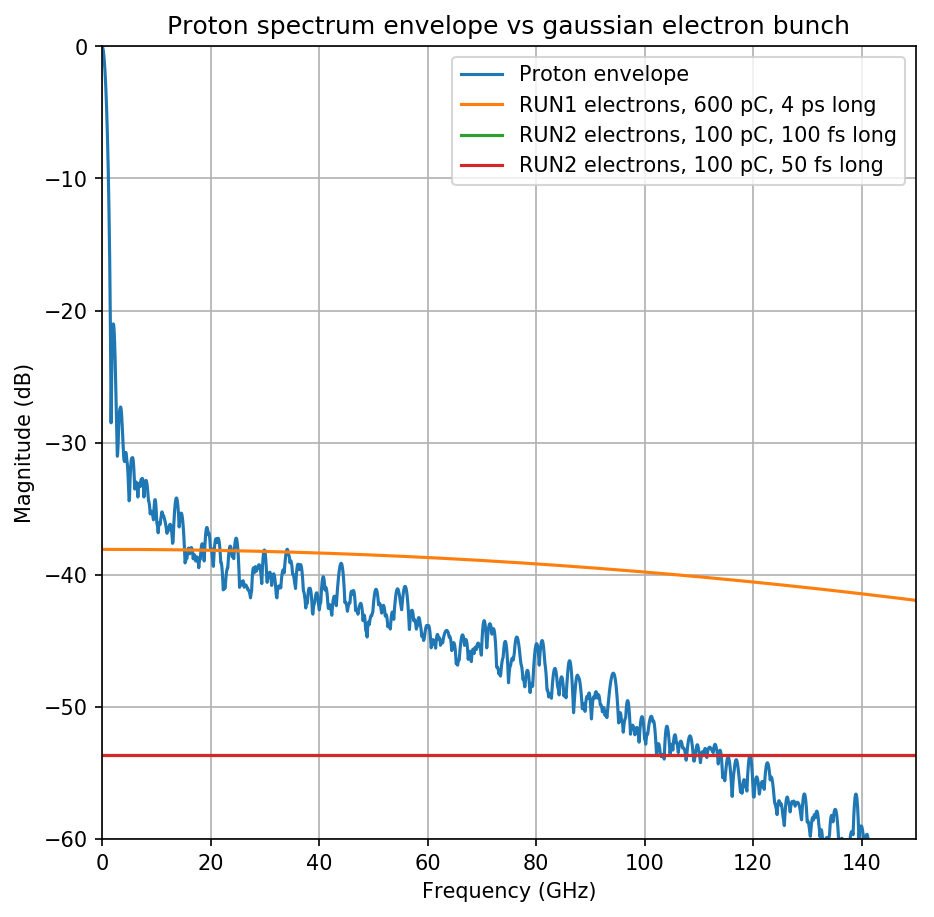

In [123]:
# print the envelope
fig, ax = plt.subplots(1, dpi=150, figsize=(7,7))
ax.plot(1e-9*data['FFT_freq'].iloc[0], envelope_dB, label='Proton envelope')

# print the electrons RUN1
ax.plot(1e-9*ff_e_2, sf_e_2_db,label='RUN1 electrons, 600 pC, 4 ps long')
# print the electrons RUN2 --> worst case possinble
ax.plot(1e-9*ff_e_4, sf_e_4_db,label='RUN2 electrons, 100 pC, 100 fs long')
ax.plot(1e-9*ff_e_5, sf_e_5_db,label='RUN2 electrons, 100 pC, 50 fs long')




ax.set_xlim(0, 150)
ax.set_ylim(-60,0)
ax.grid(which='both')

ax.set_xlabel('Frequency (GHz)')
ax.set_ylabel('Magnitude (dB)')
ax.set_title('Proton spectrum envelope vs gaussian electron bunch')

ax.legend(frameon=True)

# # print the electron spectrum 
# rr = plt.Rectangle((0, -37.5), 100, 5, color='red',alpha=0.5)
# ax.add_patch(rr)
# ax.axhline(y=-35, color='red')

plt.savefig('Proton-streak-envelope-RUN1-and-2.png',format='png',dpi=150)

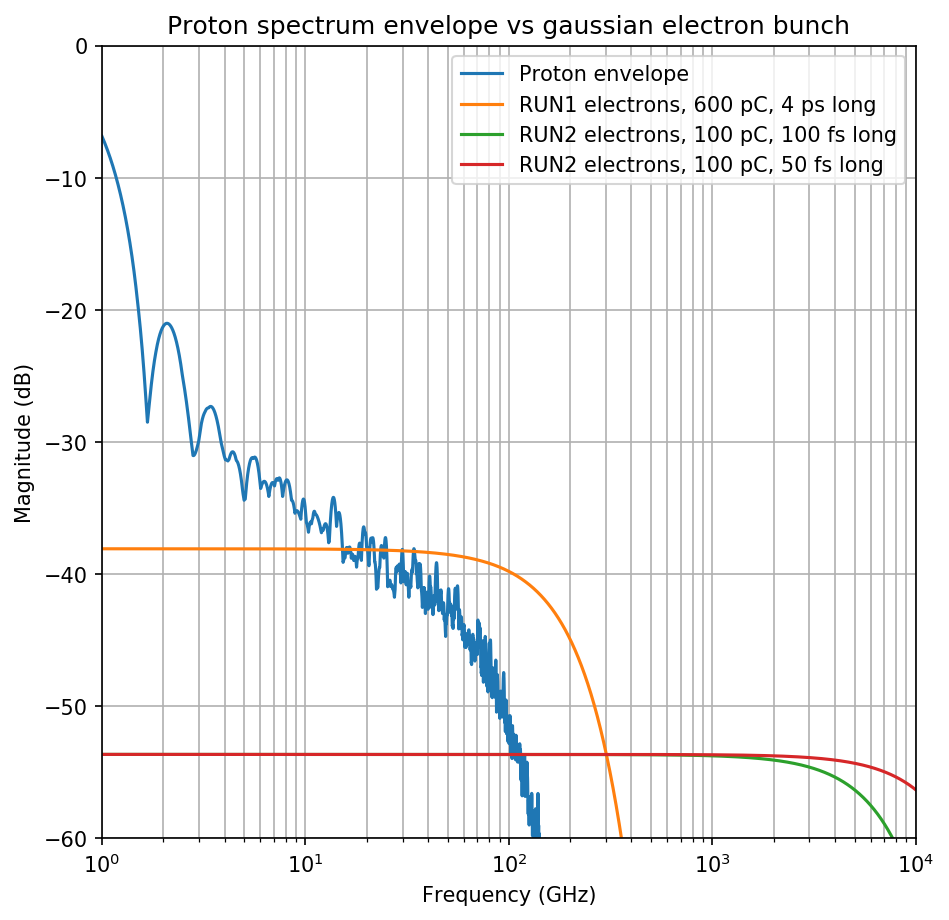

In [124]:
# print the envelope
fig, ax = plt.subplots(1, dpi=150, figsize=(7,7))
ax.plot(1e-9*data['FFT_freq'].iloc[0], envelope_dB, label='Proton envelope')

# print the electrons RUN1
ax.plot(1e-9*ff_e_2, sf_e_2_db,label='RUN1 electrons, 600 pC, 4 ps long')
# print the electrons RUN2 --> worst case possinble
ax.plot(1e-9*ff_e_4, sf_e_4_db,label='RUN2 electrons, 100 pC, 100 fs long')
ax.plot(1e-9*ff_e_5, sf_e_5_db,label='RUN2 electrons, 100 pC, 50 fs long')




ax.set_xlim(0, 1e4)
ax.set_ylim(-60,0)
ax.grid(which='both')

ax.set_xlabel('Frequency (GHz)')
ax.set_xscale('log')
ax.set_xlim(1,)
ax.set_ylabel('Magnitude (dB)')
ax.set_title('Proton spectrum envelope vs gaussian electron bunch')

ax.legend(frameon=True)

# # print the electron spectrum 
# rr = plt.Rectangle((0, -37.5), 100, 5, color='red',alpha=0.5)
# ax.add_patch(rr)
# ax.axhline(y=-35, color='red')

plt.savefig('Proton-streak-envelope-RUN1-and-2-log.png',format='png',dpi=150)